[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://bit.ly/open-data-03-franchise-input)

## 소상공인시장진흥공단 상가업소정보로 프랜차이즈 입점분석

* 배스킨라빈스와 던킨도너츠는 근처에 입지한 것을 종종 볼 수 있었어요.
* 또, 파리바게뜨와 뚜레주르는 주변에서 많이 볼 수 있는 프랜차이즈 중 하나에요. 
* 이런 프랜차이즈 매장이 얼마나 모여 있는지 혹은 흩어져 있는지 지도에 직접 표시를 해보면서 대용량 데이터에서 원하는 특정 데이터를 추출해 보는 실습을 해봅니다.
* 추출한 데이터를 전처리하고 가공해서 원하는 형태로 시각화를 하거나 지도에 표현합니다.
* Python, Pandas, Numpy, Seaborn, Matplotlib, folium 을 통해 다양한 방법으로 표현하면서 파이썬의 여러 도구들에 익숙해 지는 것을 목표로 합니다.

### 다루는 내용
* 데이터 요약하기
* 공공데이터를 활용해 텍스트 데이터 정제하고 원하는 정보 찾아내기
* 문자열에서 원하는 텍스트 추출하기
* 문자열을 활용한 다양한 분석 방법과 위치 정보 사용하기
* folium을 통한 위경도 데이터 시각화 이해하기
* folium을 통해 지도에 분석한 내용을 표현하기 - CircleMarker와 MarkerCluster 그리기


### 데이터셋
* 공공데이터 포털 : https://www.data.go.kr/dataset/15012005/fileData.do
* 영상에 사용한 데이터셋 : http://bit.ly/open-data-set-folder (공공데이터포털에서 다운로드 받은 파일이 있습니다. 어떤 파일을 다운로드 받아야 될지 모르겠다면 여기에 있는 파일을 사용해 주세요.)

## 필요한 라이브러리 불러오기

In [1]:
# pandas, numpy, seaborn,matplotlib을 불러옵니다.

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

## 시각화를 위한 한글 폰트 설정하기

In [2]:
# 템블릿 
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn', 'seaborn-bright', 'seaborn-colorblind', 'seaborn-dark', 'seaborn-dark-palette', 'seaborn-darkgrid', 'seaborn-deep', 'seaborn-muted', 'seaborn-notebook', 'seaborn-paper', 'seaborn-pastel', 'seaborn-poster', 'seaborn-talk', 'seaborn-ticks', 'seaborn-white', 'seaborn-whitegrid', 'tableau-colorblind10']


In [3]:
plt.style.use('tableau-colorblind10')

In [4]:
# 폰트가 선명하게 보이도록 설정
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')

In [5]:
# 한글폰트와 마이너스 폰트 설정 확인
plt.rc("font", family= "Malgun Gothic") 
plt.rc("axes", unicode_minus = False)  # '-' 값이 깨지지 

<AxesSubplot:title={'center':'한글'}>

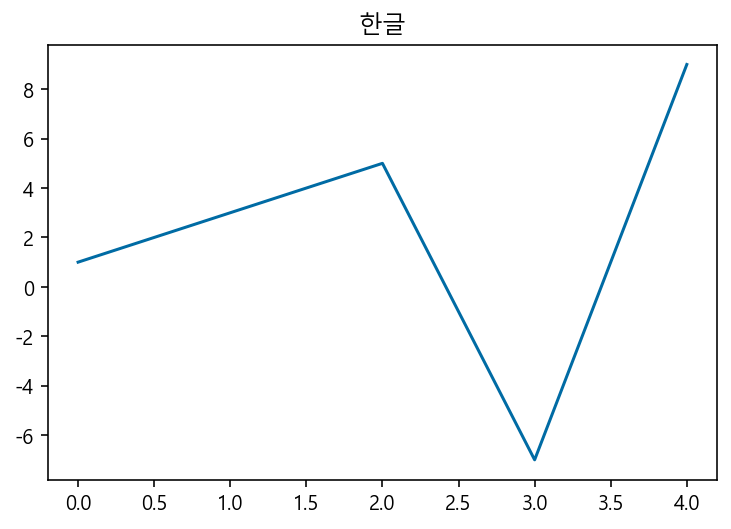

In [6]:
# 잘 설정이 되었는지 확인
pd.Series([1,3,5,-7,9]).plot(title='한글')

## Google Colab 을 위한 코드
### Colab 에서 실행을 위한 코드

* 아래의 코드는 google colaboratory 에서 실행을 위한 코드로 로컬 아나콘다에서는 주석처리합니다.
* google colaboratory 에서는 주석을 풀고 폰트 설정과 csv 파일을 불러옵니다.

In [7]:
# # 나눔고딕 설치
# !apt -qq -y install fonts-nanum > /dev/null

# import matplotlib.font_manager as fm

# fontpath = '/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf'
# font = fm.FontProperties(fname=fontpath, size=9)
# fm._rebuild()

# # 그래프에 retina display 적용
# %config InlineBackend.figure_format = 'retina'

# # Colab 의 한글 폰트 설정
# plt.rc('font', family='NanumBarunGothic') 

### Colab 용 GoogleAuth 인증 
* 구글 드라이브에 있는 파일을 가져오기 위해 사용합니다.

In [8]:
# # 구글 드라이브에서 csv 파일을 읽어오기 위해 gauth 인증
# !pip install -U -q PyDrive
# from pydrive.auth import GoogleAuth
# from pydrive.drive import GoogleDrive
# from google.colab import auth
# from oauth2client.client import GoogleCredentials

# # PyDrive client 인증
# auth.authenticate_user()
# gauth = GoogleAuth()
# gauth.credentials = GoogleCredentials.get_application_default()
# drive = GoogleDrive(gauth)

In [9]:
# # 공유 가능한 링크로 파일 가져오기
# url = 'https://drive.google.com/open?id=1e91PH_KRFxNXUsx8Hi-Q2vPiorCDsOP4'
# id = url.split('=')[1]
# print(id)
# downloaded = drive.CreateFile({'id':id}) 
# # data 폴더에 파일을 관리하며, 폴더가 없다면 만들어서 파일을 관리하도록 한다.
# %mkdir data
# downloaded.GetContentFile('data/상가업소정보_201912_01.csv')  

## 데이터 불러오기
* 공공데이터 포털 : https://www.data.go.kr/dataset/15012005/fileData.do
* 공공데이터 포털에서 소상공인시장진흥공단 상가업소정보를 다운로드 받아 사용했습니다
* 영상에 사용한 데이터셋 : http://bit.ly/open-data-set-folder (공공데이터포털에서 다운로드 받은 파일이 있습니다. 어떤 파일을 다운로드 받아야 될지 모르겠다면 여기에 있는 파일을 사용해 주세요.)

In [10]:
# 파일을 불러와 df 라는 변수에 담습니다.
df = pd.read_csv('franchise_data/소상공인시장진흥공단_상가(상권)정보_서울_202103.csv')
df.head(1)

,상가업소번호,상호명,지점명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,표준산업분류코드,...,건물관리번호,건물명,도로명주소,구우편번호,신우편번호,동정보,층정보,호정보,경도,위도
0,17174175,비지트,NaN,Q,음식,Q01,한식,Q01A01,한식/백반/한정식,I56111,...,1165010100108540018009586,상랑의빌딩,서울특별시 서초구 동광로18길 82,137837,6572.0,NaN,1,102,126.991394,37.488375


### 데이터 크기 보기

In [11]:
# shape 를 통해 불러온 csv 파일의 크기를 확인합니다.
df.shape

(315555, 39)

### info 보기

In [12]:
# info 를 사용하면 데이터의 전체적인 정보를 볼 수 있습니다.
# 데이터의 사이즈, 타입, 메모리 사용량 등을 볼 수 있습니다.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 315555 entries, 0 to 315554
Data columns (total 39 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   상가업소번호     315555 non-null  int64  
 1   상호명        315554 non-null  object 
 2   지점명        54989 non-null   object 
 3   상권업종대분류코드  315555 non-null  object 
 4   상권업종대분류명   315555 non-null  object 
 5   상권업종중분류코드  315555 non-null  object 
 6   상권업종중분류명   315555 non-null  object 
 7   상권업종소분류코드  315555 non-null  object 
 8   상권업종소분류명   315555 non-null  object 
 9   표준산업분류코드   297139 non-null  object 
 10  표준산업분류명    297139 non-null  object 
 11  시도코드       315555 non-null  int64  
 12  시도명        315555 non-null  object 
 13  시군구코드      315555 non-null  int64  
 14  시군구명       315555 non-null  object 
 15  행정동코드      315555 non-null  int64  
 16  행정동명       315555 non-null  object 
 17  법정동코드      315555 non-null  int64  
 18  법정동명       315555 non-null  object 
 19  지번코드       315555 non-n

### 결측치 보기

In [13]:
# isnull() 을 사용하면 데이터의 결측치를 볼 수 있습니다.
# 결측치는 True로 값이 있다면 False로 표시되는데 True 는 1과 같기 때문에 
# True 값을 sum()을 사용해서 더하게 되면 합계를 볼 수 있습니다.
# mean()을 사용하면 결측치의 비율을 볼 수 있습니다.
df.isnull().mean()*100

상가업소번호        0.000000
상호명           0.000317
지점명          82.573878
상권업종대분류코드     0.000000
상권업종대분류명      0.000000
상권업종중분류코드     0.000000
상권업종중분류명      0.000000
상권업종소분류코드     0.000000
상권업종소분류명      0.000000
표준산업분류코드      5.836067
표준산업분류명       5.836067
시도코드          0.000000
시도명           0.000000
시군구코드         0.000000
시군구명          0.000000
행정동코드         0.000000
행정동명          0.000000
법정동코드         0.000000
법정동명          0.000000
지번코드          0.000000
대지구분코드        0.000000
대지구분명         0.000000
지번본번지         0.000000
지번부번지        19.681830
지번주소          0.000000
도로명코드         0.000000
도로명           0.000000
건물본번지         0.000000
건물부번지        87.559696
건물관리번호        0.000000
건물명          52.708720
도로명주소         0.000000
구우편번호         0.000000
신우편번호         0.000317
동정보          92.333191
층정보          37.042037
호정보          83.745464
경도            0.000000
위도            0.000000
dtype: float64

### 사용하지 않는 컬럼 제거하기

In [14]:
df.columns

Index(['상가업소번호', '상호명', '지점명', '상권업종대분류코드', '상권업종대분류명', '상권업종중분류코드',
       '상권업종중분류명', '상권업종소분류코드', '상권업종소분류명', '표준산업분류코드', '표준산업분류명', '시도코드',
       '시도명', '시군구코드', '시군구명', '행정동코드', '행정동명', '법정동코드', '법정동명', '지번코드',
       '대지구분코드', '대지구분명', '지번본번지', '지번부번지', '지번주소', '도로명코드', '도로명', '건물본번지',
       '건물부번지', '건물관리번호', '건물명', '도로명주소', '구우편번호', '신우편번호', '동정보', '층정보',
       '호정보', '경도', '위도'],
      dtype='object')

In [15]:
# drop을 하는 방법도 있지만 사용할 컬럼만 따로 모아서 보는 방법도 있습니다.
# 여기에서는 사용할 컬럼만 따로 모아서 사용합니다.
columns = ['상호명', '상권업종대분류명','상권업종중분류명','상권업종소분류명', '시도명', '시군구명', '행정동명', '법정동명',
          '도로명주소','경도', '위도']
print(df.shape)
df = df[columns]
df.shape

(315555, 39)


(315555, 11)

In [16]:
# 제거 후 메모리 사용량 보기
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 315555 entries, 0 to 315554
Data columns (total 11 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   상호명       315554 non-null  object 
 1   상권업종대분류명  315555 non-null  object 
 2   상권업종중분류명  315555 non-null  object 
 3   상권업종소분류명  315555 non-null  object 
 4   시도명       315555 non-null  object 
 5   시군구명      315555 non-null  object 
 6   행정동명      315555 non-null  object 
 7   법정동명      315555 non-null  object 
 8   도로명주소     315555 non-null  object 
 9   경도        315555 non-null  float64
 10  위도        315555 non-null  float64
dtypes: float64(2), object(9)
memory usage: 26.5+ MB


In [17]:
# unique 를 사용하면 중복을 제거한 시군구명을 가져옵니다. 
# 그리고 shape로 갯수를 출력해 봅니다.
df['시군구명'].unique()

array(['서초구', '동작구', '종로구', '영등포구', '송파구', '성동구', '금천구', '강동구', '마포구',
       '관악구', '양천구', '강남구', '중랑구', '은평구', '성북구', '서대문구', '중구', '동대문구',
       '강북구', '광진구', '용산구', '강서구', '구로구', '도봉구', '노원구'], dtype=object)

In [18]:
# nunique 를 사용하면 중복을 제거한 시군구명의 갯수를 세어줍니다.
df['시군구명'].nunique()

25

## 파일로 저장하기
* 전처리한 파일을 저장해 두면 재사용을 할 수 있습니다.
* 재사용을 위해 파일로 저장합니다.

In [19]:
# "seoul_open_store.csv" 라는 이름으로 저장합니다.
df.to_csv("franchise_data/seoul_open_store.csv" ,index=False)

In [20]:
# 제대로 저장이 되었는지 같은 파일을 불러와서 확인합니다.
pd.read_csv("franchise_data/seoul_open_store.csv").head()

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도
0,비지트,음식,한식,한식/백반/한정식,서울특별시,서초구,방배4동,방배동,서울특별시 서초구 동광로18길 82,126.991394,37.488375
1,쓰리에프,음식,한식,한식/백반/한정식,서울특별시,동작구,사당2동,사당동,서울특별시 동작구 동작대로27가길 12,126.980952,37.487105
2,채움,음식,한식,한식/백반/한정식,서울특별시,종로구,종로1.2.3.4가동,수송동,서울특별시 종로구 삼봉로 81,126.981794,37.572387
3,호구의주방,소매,가정/주방/인테리어,주방가구판매,서울특별시,영등포구,양평2동,양평동4가,서울특별시 영등포구 선유로 269,126.897892,37.536700
4,BYC상신점,소매,의복의류,셔츠/내의/속옷,서울특별시,송파구,거여2동,거여동,서울특별시 송파구 오금로 527,127.147321,37.493054


## 배스킨라빈스, 던킨도너츠 위치 분석

### 특정 상호만 가져오기
* 여기에서는 배스킨라빈스와 던킨도너츠 상호를 가져와서 실습합니다.
* 위에서 pandas의 str.conatains를 활용해 봅니다.
* https://pandas.pydata.org/docs/user_guide/text.html#testing-for-strings-that-match-or-contain-a-pattern

* 상호명에서 브랜드명을 추출합니다.
* 대소문자가 섞여 있을 수도 있기 때문에 대소문자를 변환해 줍니다.
* 오타를 방지하기 위해 배스킨라빈스의 영문명은 baskinrobbins, 던킨도너츠는 dunkindonuts 입니다.

In [21]:
df = df.dropna()

In [22]:
# 문자열의 소문자로 변경하는 메소드를 사용합니다.
# "상호명_소문자" 컬럼을 만듭니다.
df['상호명_소문자'] = df['상호명'].str.lower()
df.head()

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자
0,비지트,음식,한식,한식/백반/한정식,서울특별시,서초구,방배4동,방배동,서울특별시 서초구 동광로18길 82,126.991394,37.488375,비지트
1,쓰리에프,음식,한식,한식/백반/한정식,서울특별시,동작구,사당2동,사당동,서울특별시 동작구 동작대로27가길 12,126.980952,37.487105,쓰리에프
2,채움,음식,한식,한식/백반/한정식,서울특별시,종로구,종로1.2.3.4가동,수송동,서울특별시 종로구 삼봉로 81,126.981794,37.572387,채움
3,호구의주방,소매,가정/주방/인테리어,주방가구판매,서울특별시,영등포구,양평2동,양평동4가,서울특별시 영등포구 선유로 269,126.897892,37.536700,호구의주방
4,BYC상신점,소매,의복의류,셔츠/내의/속옷,서울특별시,송파구,거여2동,거여동,서울특별시 송파구 오금로 527,127.147321,37.493054,byc상신점


In [54]:
# baskinrobbins 를 "상호명_소문자" 컬럼으로 가져옵니다.
# 띄어쓰기 등의 다를 수 있기 때문에 앞글자 baskin 만 따서 가져오도록 합니다.
# '상호명_소문자'컬럼으로 '베스킨라빈스|배스킨라빈스|baskin' 를 가져와 갯수를 세어봅니다.
# loc[행]
# loc[행, 열]

df[df['상호명_소문자'].str.contains('베스킨라빈스|배스킨라빈스|baskin')]

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자
633,배스킨라빈스공릉점,음식,패스트푸드,아이스크림판매,서울특별시,노원구,공릉2동,공릉동,서울특별시 노원구 공릉로 198,127.078586,37.627425,배스킨라빈스공릉점
2462,배스킨라빈스강남중앙,음식,패스트푸드,아이스크림판매,서울특별시,강남구,역삼1동,역삼동,서울특별시 강남구 강남대로96길 9,127.027724,37.499852,배스킨라빈스강남중앙
4504,배스킨라빈스31,음식,패스트푸드,아이스크림판매,서울특별시,강서구,등촌1동,등촌동,서울특별시 강서구 화곡로 398,126.854800,37.558456,배스킨라빈스31
5841,배스킨라빈스31상봉역점,음식,패스트푸드,아이스크림판매,서울특별시,중랑구,상봉2동,상봉동,서울특별시 중랑구 면목로 495,127.085303,37.596040,배스킨라빈스31상봉역점
6065,배스킨라빈스31서초점,음식,패스트푸드,아이스크림판매,서울특별시,서초구,서초3동,방배동,서울특별시 서초구 효령로 186,127.004329,37.482474,배스킨라빈스31서초점
...,...,...,...,...,...,...,...,...,...,...,...,...
307461,배스킨라빈스31,음식,패스트푸드,아이스크림판매,서울특별시,종로구,삼청동,화동,서울특별시 종로구 율곡로3길 74-1,126.982214,37.579004,배스킨라빈스31
307462,배스킨라빈스31,음식,패스트푸드,아이스크림판매,서울특별시,성동구,왕십리도선동,하왕십리동,서울특별시 성동구 왕십리로 410,127.024062,37.566545,배스킨라빈스31
313117,배스킨라빈스31,음식,패스트푸드,아이스크림판매,서울특별시,강동구,고덕2동,고덕동,서울특별시 강동구 고덕로 385,127.168400,37.557360,배스킨라빈스31
313118,배스킨라빈스31,음식,패스트푸드,아이스크림판매,서울특별시,동작구,상도1동,상도동,서울특별시 동작구 상도로 364-1,126.953406,37.496063,배스킨라빈스31


In [55]:
# 상호명에서 던킨도너츠만 가져옵니다.
# 상호명은 소문자로 변경해 준 컬럼을 사용합니다.
# 던킨|dunkin 의 "상호명_소문자"로 갯수를 세어봅니다.

df[df['상호명_소문자'].str.contains('던킨|dunkin')]

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자
320,던킨도너츠동대문홈플러스,음식,패스트푸드,도너츠전문,서울특별시,동대문구,용신동,용두동,서울특별시 동대문구 천호대로 133,127.038754,37.574540,던킨도너츠동대문홈플러스
760,던킨도너츠,음식,패스트푸드,도너츠전문,서울특별시,중구,소공동,태평로2가,서울특별시 중구 세종대로 93,126.976613,37.564692,던킨도너츠
5291,던킨도너츠,음식,제과제빵떡케익,제과점,서울특별시,강남구,삼성1동,삼성동,서울특별시 강남구 영동대로 513,127.059139,37.511820,던킨도너츠
5717,던킨도너츠,음식,패스트푸드,도너츠전문,서울특별시,서초구,양재2동,양재동,서울특별시 서초구 청계산로 10,127.043512,37.463488,던킨도너츠
11538,던킨도너츠광운대역,음식,패스트푸드,도너츠전문,서울특별시,노원구,월계1동,월계동,서울특별시 노원구 석계로 98-2,127.061750,37.623021,던킨도너츠광운대역
...,...,...,...,...,...,...,...,...,...,...,...,...
299729,던킨도너츠테크노마트점,음식,패스트푸드,도너츠전문,서울특별시,광진구,구의3동,구의동,서울특별시 광진구 광나루로56길 85,127.095681,37.535713,던킨도너츠테크노마트점
301641,던킨도너츠,음식,패스트푸드,도너츠전문,서울특별시,마포구,서교동,동교동,서울특별시 마포구 양화로 157,126.922928,37.556682,던킨도너츠
302933,던킨,음식,패스트푸드,도너츠전문,서울특별시,양천구,신정4동,신정동,서울특별시 양천구 신월로 289,126.852911,37.521459,던킨
307521,던킨도너츠,음식,패스트푸드,도너츠전문,서울특별시,동작구,대방동,대방동,서울특별시 동작구 알마타길 6,126.924959,37.509801,던킨도너츠


In [58]:
# '상호명_소문자'컬럼으로  '배스킨라빈스|베스킨라빈스|baskin|던킨|dunkin'를 가져와 df_31 변수에 담습니다.
df_31 = df[df['상호명_소문자'].str.contains('베스킨라빈스|배스킨라빈스|baskin|던킨|dunkin')]
df_31.shape

(548, 12)

In [61]:
# '브랜드명' 컬럼을 만들고 배스킨라빈스로 통일시켜주기

df_31.loc[df_31['상호명_소문자'].str.contains('베스킨라빈스|배스킨라빈스|baskin'),'브랜드명'] = '배스킨라빈스'
df_31.head(3)

C:\ProgramData\Anaconda3\anaconda\lib\site-packages\pandas\core\indexing.py:1599: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = infer_fill_value(value)
C:\ProgramData\Anaconda3\anaconda\lib\site-packages\pandas\core\indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자,브랜드명
320,던킨도너츠동대문홈플러스,음식,패스트푸드,도너츠전문,서울특별시,동대문구,용신동,용두동,서울특별시 동대문구 천호대로 133,127.038754,37.574540,던킨도너츠동대문홈플러스,NaN
633,배스킨라빈스공릉점,음식,패스트푸드,아이스크림판매,서울특별시,노원구,공릉2동,공릉동,서울특별시 노원구 공릉로 198,127.078586,37.627425,배스킨라빈스공릉점,배스킨라빈스
760,던킨도너츠,음식,패스트푸드,도너츠전문,서울특별시,중구,소공동,태평로2가,서울특별시 중구 세종대로 93,126.976613,37.564692,던킨도너츠,NaN


In [63]:
# ~은 not을 의미합니다. 베스킨라빈스가 아닌 데이터를 찾을 때 사용하면 좋습니다.
# 아래 코드처럼 결측치를 던킨도너츠로 채워줘도 괜찮습니다.

df_31['브랜드명'] = df_31['브랜드명'].fillna('던킨도너츠')

<ipython-input-63-a8368398370b>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_31['브랜드명'] = df_31['브랜드명'].fillna('던킨도너츠')


In [27]:
# 'df_31에 담긴 상호명','브랜드명'으로 미리보기를 합니다.
# df_31.loc[~df_31["상호명_소문자"].str.contains("배스킨라빈스|베스킨라빈스|baskinrobbins"), 
#           "브랜드명"]

In [64]:
# 데이터가 제대로 모아졌는지 확인합니다.
# "상권업종대분류명"을  value_counts 를 통해 빈도수를 계산합니다.

df_31['상권업종대분류명'].value_counts()

음식    547
소매      1
Name: 상권업종대분류명, dtype: int64

In [66]:
# "상권업종대분류명"컬럼에서 isin 기능을 사용해서 "소매", "생활서비스" 인 데이터만 가져옵니다.

df_31[df_31['상권업종대분류명'].isin(['소매'])]

# 우리가 아는 베스킨라빈스 아이스크림점이 아닌것 같음

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자,브랜드명
178841,배스킨라빈스,소매,종합소매점,할인점,서울특별시,강남구,압구정동,신사동,서울특별시 강남구 압구정로 204,127.029381,37.527375,배스킨라빈스,배스킨라빈스


In [69]:
# "상권업종대분류명"에서 "소매", "생활서비스"는 제외합니다.
df_31 = df_31[~df_31['상권업종대분류명'].isin(['소매'])].copy()
df_31.shape

(547, 13)

### 범주형 값으로 countplot 그리기

In [74]:
# value_counts 로 "브랜드명"의 빈도수를 구합니다.
brand_count = df_31['브랜드명'].value_counts()

In [72]:
# normalize=True 로 빈도수의 비율을 구합니다.
df_31['브랜드명'].value_counts(normalize = True)*100

배스킨라빈스    77.14808
던킨도너츠     22.85192
Name: 브랜드명, dtype: float64

In [77]:
for i,w in enumerate(brand_count):
    print(i,w)

0 422
1 125


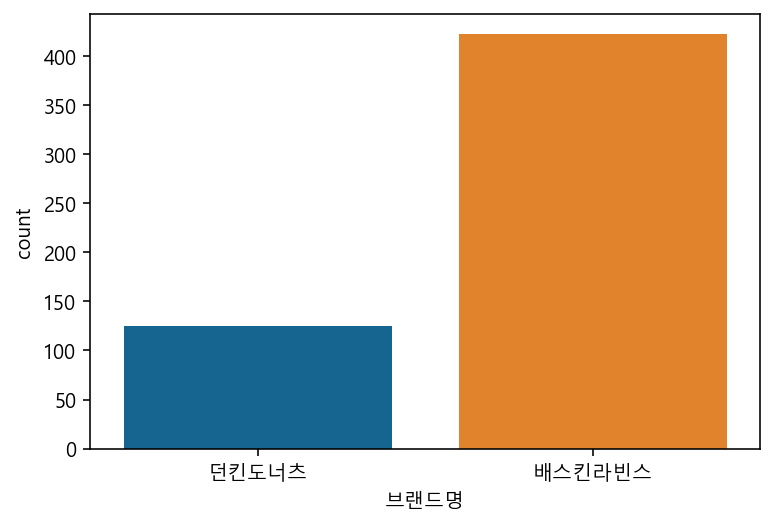

In [79]:
# countplot 을 그립니다.

g = sns.countplot(data = df_31, x='브랜드명')

<AxesSubplot:xlabel='시군구명', ylabel='count'>

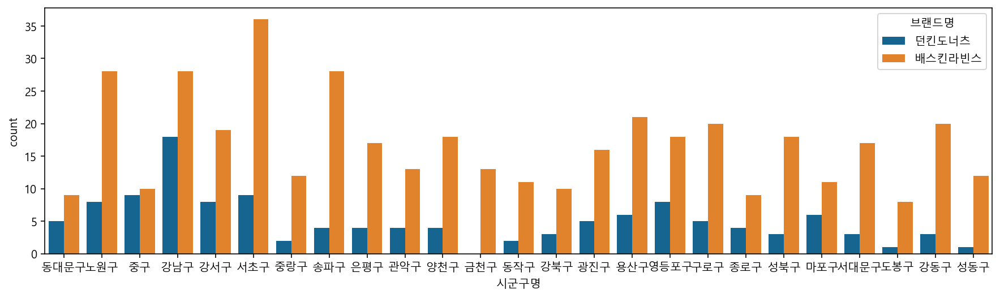

In [82]:
# 시군구명으로 빈도수를 세고 브랜드명으로 색상을 다르게 표현하는 countplot 을 그립니다.
plt.figure(figsize = (15,4))
sns.countplot(data=df_31, x='시군구명', hue='브랜드명')

### scatterplot 그리기

* https://pandas.pydata.org/pandas-docs/stable/user_guide/visualization.html#scatter-plot

<AxesSubplot:xlabel='경도', ylabel='위도'>

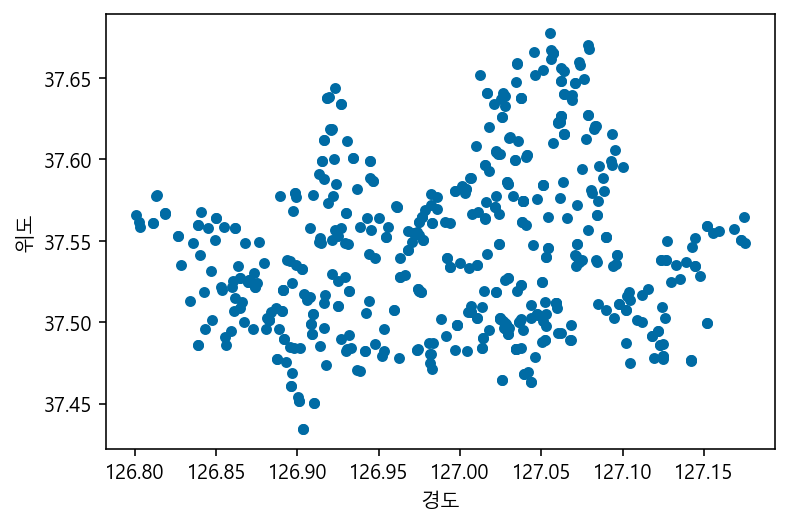

In [83]:
# Pandas 의 plot 으로 scatterplot 을 그립니다.
# 위도와 경도를 이용하여 매장의 위치를 찍어봄
df_31[['위도','경도']].plot.scatter(x='경도', y='위도')

<AxesSubplot:xlabel='경도', ylabel='위도'>

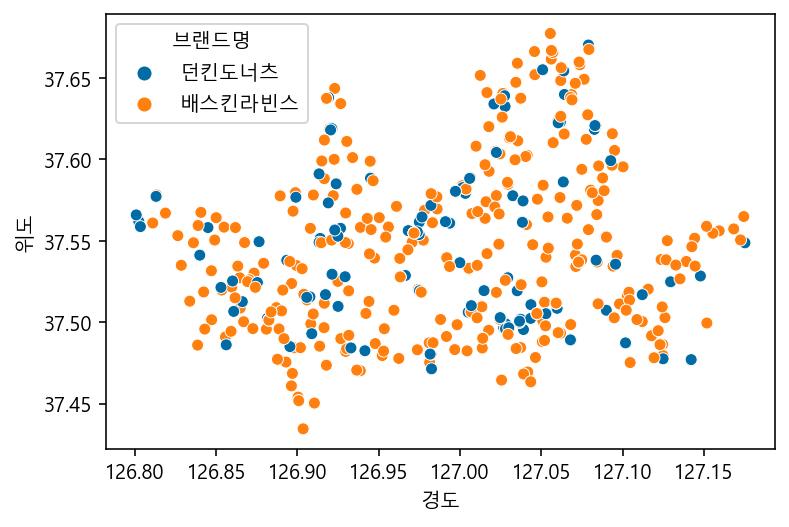

In [84]:
# seaborn의 scatterplot 으로 hue에 브랜드명을 지정해서 시각화 합니다.
sns.scatterplot(data=df_31, x='경도', y='위도', hue='브랜드명')

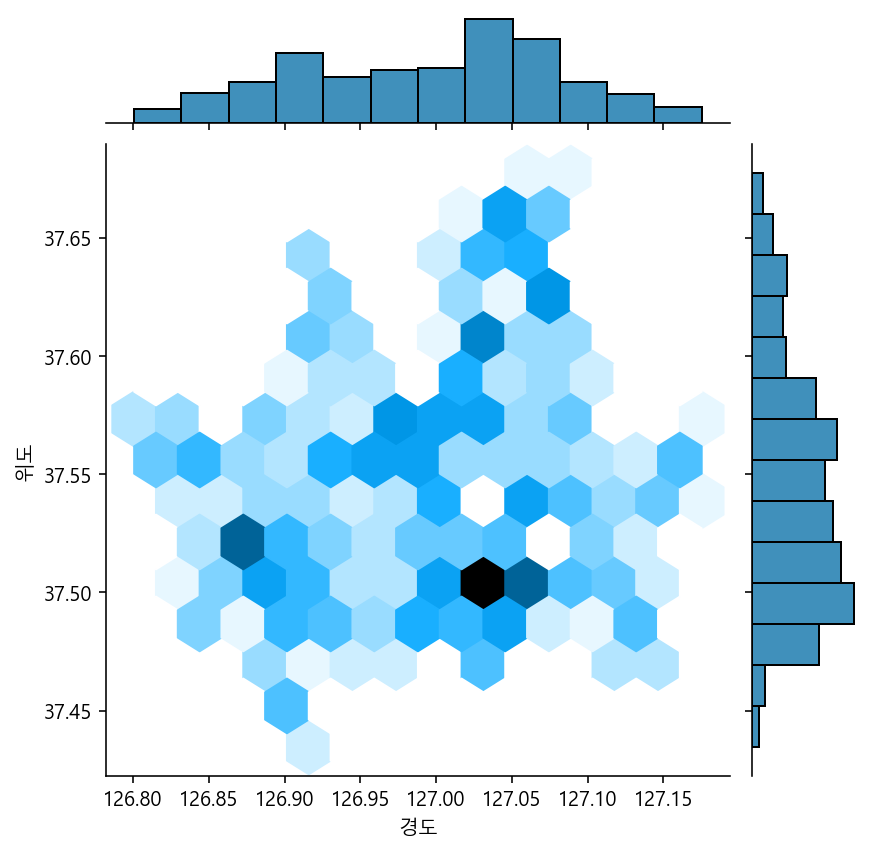

In [86]:
# 위에서 그렸던 그래프를 jointplot 으로 kind="hex" 을 사용해 그려봅니다.
sns.jointplot(data=df_31,x='경도', y='위도',kind ='hex')

## Folium 으로 지도 활용하기
* 다음의 프롬프트 창을 열어 conda 명령어로 설치합니다.
<img src="https://i.imgur.com/x7pzfCP.jpg">
* <font color="red">주피터 노트북 상에서 설치가 되지 않으니</font> anaconda prompt 를 열어서 설치해 주세요.


* 윈도우
    * <font color="red">관리자 권한</font>으로 아나콘다를 설치하셨다면 다음의 방법으로 anaconda prompt 를 열어 주세요.
    <img src="https://i.imgur.com/GhoLwsd.png">
* 맥
    * terminal 프로그램을 열어 설치해 주세요. 


* 다음의 문서를 활용해서 지도를 표현합니다.
* https://nbviewer.jupyter.org/github/python-visualization/folium/blob/master/examples/Quickstart.ipynb
* Folium 사용예제 :
http://nbviewer.jupyter.org/github/python-visualization/folium/tree/master/examples/

< 사용할 Method>
* 1. folium.Map()
* 2. folium.Marker()

folium.CircleMarker
folium.ColorMap
등 다항한 Method가 있다.

In [87]:
# 아나콘다에서 folium 을 사용하기 위해서는 별도의 설치가 필요
# https://anaconda.org/conda-forge/folium
# conda install -c conda-forge folium 
# 지도 시각화를 위한 라이브러리
import folium 
folium.

In [90]:
# 지도의 중심을 지정하기 위해 위도와 경도의 평균을 구합니다. 
lat = df_31['위도'].mean()
long = df_31['경도'].mean()
lat,long

(37.54489987991851, 126.99457568465684)

In [93]:
# 샘플을 하나(경도, 위도의 평균값) 추출해서 지도에 표시해 봅니다.

m = folium.Map(location = [lat,long],zoom_start=13)
m

### 기본 Marker 표시하기

In [97]:
df_31.sample( random_state=42)

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자,브랜드명
65280,배스킨라빈스31,음식,패스트푸드,아이스크림판매,서울특별시,광진구,광장동,광장동,서울특별시 광진구 아차산로 494,127.096667,37.541145,배스킨라빈스31,배스킨라빈스


In [100]:
folium.Marker([37.541145,127.096667], 
              popup="<i>배스킨라빈스</i>",  # 클릭시 보여지는 기능
              tooltip='배스킨라빈스').add_to(m)  # 마우스 가져데면 보임 
# popup 보다는 tooltip 추천

m

In [42]:
# html 파일로 저장하기
# tooltip 의 한글이 깨져보인다면 html 파일로 저장해서 보세요.
m.save('index.html')

### 서울의 배스킨라빈스와 던킨도너츠 매장 분포
* 배스킨라빈스와 던킨도너츠 매장을 지도에 표현합니다.

In [101]:
# 데이터프레임의 인덱스만 출력합니다.
df_31.index

Int64Index([   320,    633,    760,   2462,   4504,   5291,   5717,   5841,
              6065,   8587,
            ...
            306313, 306721, 307460, 307461, 307462, 307521, 309584, 313117,
            313118, 315528],
           dtype='int64', length=547)

### 기본 마커로 표현하기

In [110]:
df_31.head(1)

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자,브랜드명
320,던킨도너츠동대문홈플러스,음식,패스트푸드,도너츠전문,서울특별시,동대문구,용신동,용두동,서울특별시 동대문구 천호대로 133,127.038754,37.57454,던킨도너츠동대문홈플러스,던킨도너츠


In [118]:
# icon=folium.Icon(color=icon_color) 로 아이콘 컬러를 변경합니다.
# 상호명과 도로명 주소 마커로 표현해보기
# 던킨과 배스킨라빈스 마커 색상다르게 표현하기
# 던킨 마커 : 빨강 , 배스킨 마커 : 파랑

m = folium.Map(location = [lat,long],zoom_start=13)

for i in df_31.index: 
    
    sub_lat = df_31['위도'][i]
    sub_long =  df_31['경도'][i]
    title = df_31['상호명'][i] + '/' + df_31['도로명주소'][i]
    
    if df_31['브랜드명'][i] == '던킨도너츠':
        icon_color = 'red'
    else:
        icon_color = 'blue'
    
    folium.Marker([sub_lat, sub_long],
              popup = f"<i>{title}</i>",  # 클릭시 보여지는 기능
              tooltip = title ,
              icon=folium.Icon(color=icon_color)).add_to(m)  # 마우스 가져데면 보임 
               
                
# popup 보다는 tooltip 추천

m
    

### MarkerCluster 로 표현하기
* https://nbviewer.jupyter.org/github/python-visualization/folium/blob/master/examples/MarkerCluster.ipynb

In [119]:
# icon=folium.Icon(color=icon_color) 로 아이콘 컬러를 변경합니다.
import folium
from folium.plugins import MarkerCluster

m = folium.Map(location = [lat,long],zoom_start=13)
marker_cluster = MarkerCluster().add_to(m)

for i in df_31.index: 
    
    sub_lat = df_31['위도'][i]
    sub_long =  df_31['경도'][i]
    title = df_31['상호명'][i] + '/' + df_31['도로명주소'][i]
    
    if df_31['브랜드명'][i] == '던킨도너츠':
        icon_color = 'red'
    else:
        icon_color = 'blue'
    
    folium.Marker([sub_lat, sub_long],
              popup = f"<i>{title}</i>",  # 클릭시 보여지는 기능
              tooltip = title ,
              icon=folium.Icon(color=icon_color)).add_to(marker_cluster)  # 마우스 가져데면 보임 
               

m
    

## 파리바게뜨와 뚜레주르 분석하기

### 데이터 색인으로 가져오기

In [122]:
# str.contains 를 사용해서 뚜레(주|쥬)르|파리(바게|크라상) 으로 상호명을 찾습니다.
# df_bread 라는 데이터프레임에 담습니다.

df_bread = df[df['상호명'].str.contains('뚜레주르|뚜레쥬르|파리바게|파리크라상')].copy()
df_bread.shape

(645, 12)

### 가져온 데이터가 맞는지 확인하기

In [125]:
# 잘못 가져온 데이터가 있는지 확인합니다.
df_bread['상권업종대분류명'].value_counts

# 다 음식으로 괜찮아보임

음식    645
Name: 상권업종대분류명, dtype: int64

In [128]:
# 상호명이 '파스쿠찌|잠바주스'가 아닌 것만 가져오세요.

df_bread[df_bread['상호명'].str.contains('파스쿠찌|잠바주스')]

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자
133020,파리크라상파스쿠찌홍,음식,커피점/카페,커피전문점/카페/다방,서울특별시,마포구,서강동,상수동,서울특별시 마포구 와우산로 94,126.924922,37.552600,파리크라상파스쿠찌홍
149766,파리크라상파스쿠찌서,음식,커피점/카페,커피전문점/카페/다방,서울특별시,종로구,이화동,연건동,서울특별시 종로구 대학로 101,126.997184,37.580448,파리크라상파스쿠찌서
245686,파리크라상잠바주스동,음식,제과제빵떡케익,제과점,서울특별시,용산구,이촌1동,이촌동,서울특별시 용산구 이촌로 245,126.974348,37.520170,파리크라상잠바주스동
292175,파리크라상파스쿠찌압구정역2호,음식,제과제빵떡케익,제과점,서울특별시,강남구,신사동,신사동,서울특별시 강남구 압구정로 162,127.027449,37.526305,파리크라상파스쿠찌압구정역2호


In [132]:
# 상호명이 '파스쿠찌|잠바주스인 데이터 제거 후 다시 df_bread에 넣어준다.

df_bread = df_bread[~df_bread['상호명'].str.contains('파스쿠찌|잠바주스')].copy()

In [137]:
# 브랜드명 컬럼을 만듭니다. "파리바게뜨" 에 해당되는 데이터에 대한 값을 채워줍니다.
# 파리크라상에 대한 처리를 따로 해주세요!
df_bread.loc[df_bread["상호명"].str.contains("파리바게|파리크라상"), "브랜드명"] = "파리바게뜨"
df_bread.head(1)

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자,브랜드명
579,뚜레쥬르서울대병원,음식,제과제빵떡케익,제과점,서울특별시,종로구,이화동,연건동,서울특별시 종로구 대학로 101,126.997184,37.580448,뚜레쥬르서울대병원,뚜레쥬르


In [138]:
# 브랜드명 컬럼의 결측치는 "뚜레쥬르" 이기 때문에 fillna 를 사용해서 값을 채웁니다.
df_bread['브랜드명'] = df_bread['브랜드명'].fillna('뚜레쥬르')

### 범주형 변수 빈도수 계산하기

In [139]:
# 브랜드명의 빈도수를 봅니다.
df_bread['브랜드명'].value_counts()

파리바게뜨    433
뚜레쥬르     208
Name: 브랜드명, dtype: int64

In [142]:
df_bread['브랜드명'].value_counts(normalize = True)*100

파리바게뜨    67.550702
뚜레쥬르     32.449298
Name: 브랜드명, dtype: float64

<AxesSubplot:xlabel='브랜드명', ylabel='count'>

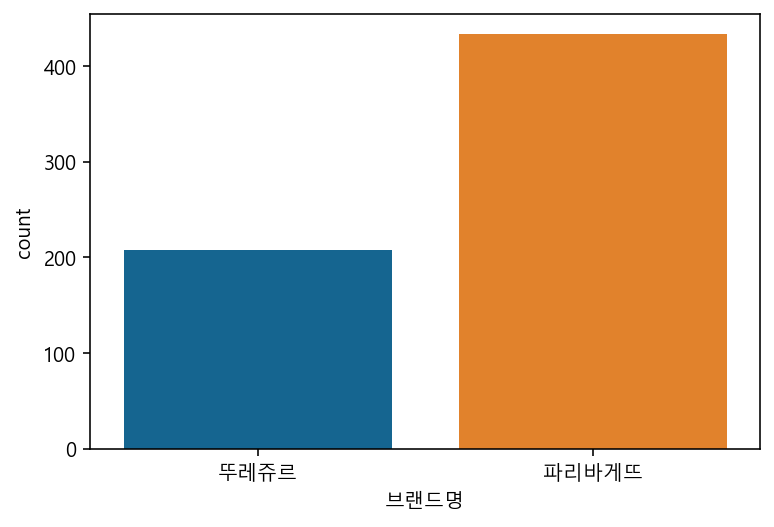

In [143]:
# countplot 으로 브랜드명을 그려봅니다.
sns.countplot(data=df_bread, x='브랜드명')

<AxesSubplot:xlabel='시군구명', ylabel='count'>

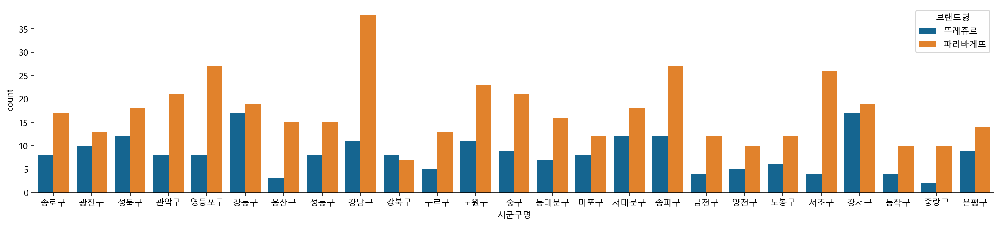

In [149]:
# 시군구별로 브랜드명의 빈도수 차이를 비교합니다.
plt.figure(figsize = (20,4))
sns.countplot(data=df_bread, x='시군구명', hue='브랜드명')

<AxesSubplot:xlabel='경도', ylabel='위도'>

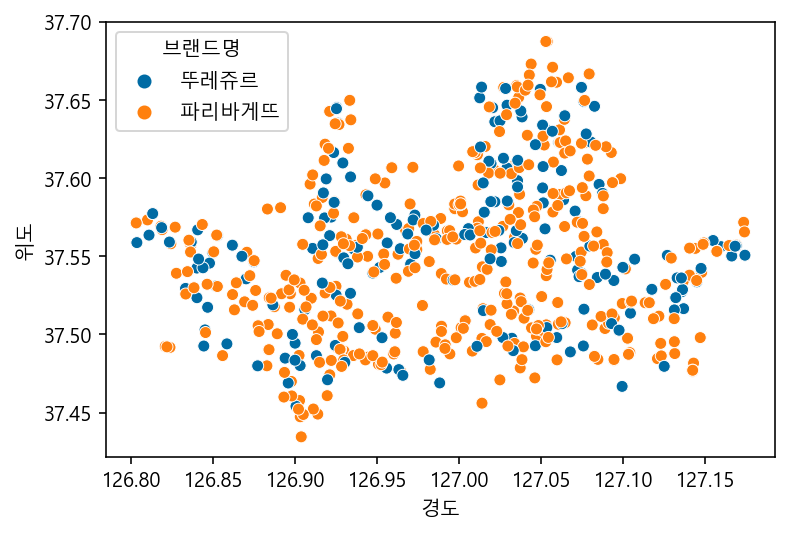

In [150]:
# scatterplot 으로 위경도를 표현해 봅니다.

sns.scatterplot(data=df_bread , x= '경도', y='위도', hue = '브랜드명')

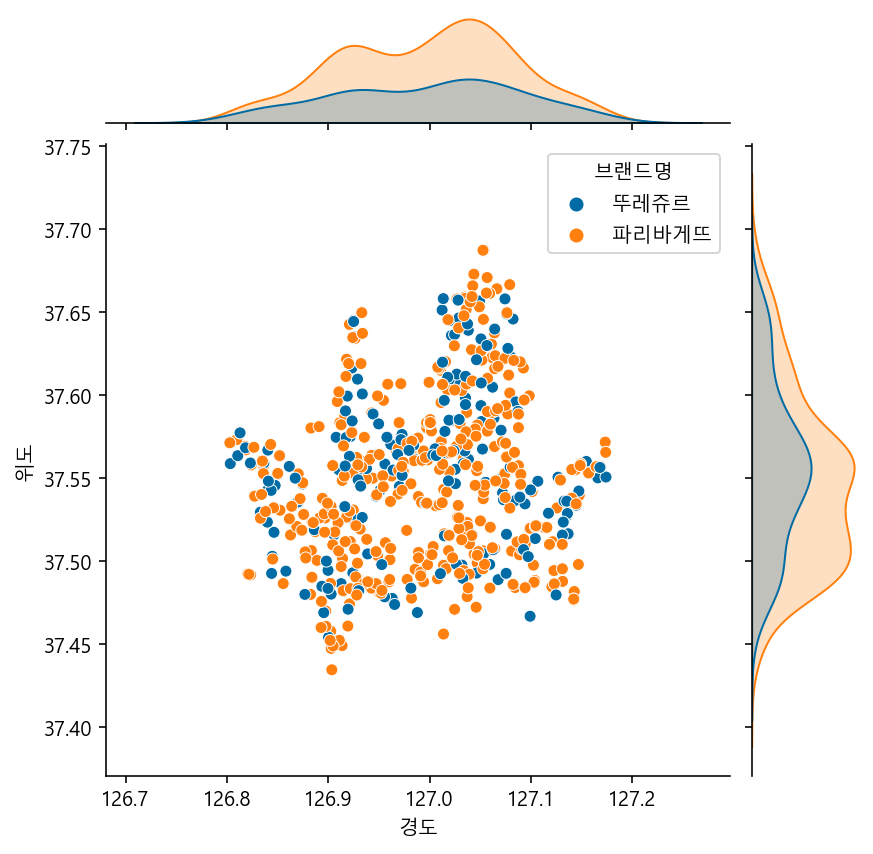

In [155]:
# jointplot 으로 위경도를 표현해 봅니다.
sns.jointplot(data= df_bread, x= '경도', y ='위도', hue = '브랜드명')

## 지도에 표현하기
### Marker 로 위치를 찍어보기

In [157]:
df_bread.head(1)

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자,브랜드명
579,뚜레쥬르서울대병원,음식,제과제빵떡케익,제과점,서울특별시,종로구,이화동,연건동,서울특별시 종로구 대학로 101,126.997184,37.580448,뚜레쥬르서울대병원,뚜레쥬르


In [156]:
lat = df_bread['위도'].mean()
long = df_bread['경도'].mean()
lat,long

(37.55077227622872, 126.99677682225668)

In [159]:
df_bread.index

Int64Index([   579,   1814,   2341,   3195,   3386,   3491,   3607,   3763,
              4179,   4277,
            ...
            309104, 309105, 309368, 310003, 310468, 310471, 312301, 312618,
            312751, 314960],
           dtype='int64', length=641)

In [161]:
m = folium.Map(location = [lat,long],zoom_start=13)

for i in df_bread.index: 
    
    sub_lat = df_bread['위도'][i]
    sub_long =  df_bread['경도'][i]
    title = df_bread['상호명'][i] + '/' + df_bread['도로명주소'][i]
    
    if df_bread['브랜드명'][i] == '뚜레쥬르':
        icon_color = 'purple'
    else:
        icon_color = 'orange'
    
    folium.Marker([sub_lat, sub_long],
              popup = f"<i>{title}</i>",  # 클릭시 보여지는 기능
              tooltip = title ,
              icon=folium.Icon(color=icon_color)).add_to(m)  # 마우스 가져데면 보임 
               
                
# popup 보다는 tooltip 추천

m
    

In [166]:
# tiles='Stamen Toner' 추가해보기

m = folium.Map(location = [lat,long],zoom_start=13, tiles='Stamen Toner')

for i in df_bread.index: 
    
    sub_lat = df_bread['위도'][i]
    sub_long =  df_bread['경도'][i]
    title = df_bread['상호명'][i] + '/' + df_bread['도로명주소'][i]
    
    if df_bread['브랜드명'][i] == '뚜레쥬르':
        icon_color = 'purple'
    else:
        icon_color = 'orange'
    
    folium.Marker([sub_lat, sub_long],
              popup = f"<i>{title}</i>",  # 클릭시 보여지는 기능
              tooltip = title ,
              icon=folium.Icon(color=icon_color)).add_to(m)  # 마우스 가져데면 보임 
               
                
# popup 보다는 tooltip 추천

m

### Circle로 위치 찍어보기

In [169]:
# folium

m = folium.Map(location = [lat,long],zoom_start=13, tiles='Stamen Toner')

for i in df_bread.index: 
    
    sub_lat = df_bread['위도'][i]
    sub_long =  df_bread['경도'][i]
    title = df_bread['상호명'][i] + '/' + df_bread['도로명주소'][i]
    
    if df_bread['브랜드명'][i] == '뚜레쥬르':
        icon_color = 'purple'
    else:
        icon_color = 'orange'
    
    folium.Circle(
                radius=100,
                location = [sub_lat, sub_long],
                popup = f"<i>{title}</i>",  # 클릭시 보여지는 기능
                tooltip = title ,
                color = 'red',
                fill=False
                ).add_to(m)  # 마우스 가져데면 보임 
               
m

### CircleMarker로 표현해보기

In [174]:
m = folium.Map(location = [lat,long],zoom_start=13, tiles='Stamen Toner')

for i in df_bread.index: 
    
    sub_lat = df_bread['위도'][i]
    sub_long =  df_bread['경도'][i]
    title = df_bread['상호명'][i] + '/' + df_bread['도로명주소'][i]
    
    if df_bread['브랜드명'][i] == '뚜레쥬르':
        icon_color = 'purple'
    else:
        icon_color = 'orange'
    
    folium.CircleMarker(
                radius=10,
                location = [sub_lat, sub_long],
                popup = f"<i>{title}</i>",  # 클릭시 보여지는 기능
                tooltip = title ,
                color = 'green',
                fill=False,
                fill_color= 'green'
                ).add_to(m)  # 마우스 가져데면 보임 
               
m

### MarkerCluster 로 표현하기
* https://nbviewer.jupyter.org/github/python-visualization/folium/blob/master/examples/MarkerCluster.ipynb

In [164]:
import folium
from folium.plugins import MarkerCluster

m = folium.Map(location = [lat,long],zoom_start=13)
marker_cluster = MarkerCluster().add_to(m)

for i in df_bread.index: 
    
    sub_lat = df_bread['위도'][i]
    sub_long =  df_bread['경도'][i]
    title = df_bread['상호명'][i] + '/' + df_bread['도로명주소'][i]
    
    if df_bread['브랜드명'][i] == '뚜레쥬르':
        icon_color = 'purple'
    else:
        icon_color = 'orange'
    
    folium.Marker([sub_lat, sub_long],
              popup = f"<i>{title}</i>",  # 클릭시 보여지는 기능
              tooltip = title ,
              icon=folium.Icon(color=icon_color)).add_to(marker_cluster)  # 마우스 가져데면 보임 
m             

### tiles (Map style) 다르게 해보기

In [176]:
m = folium.Map(location = [lat,long], zoom_start=13, tiles="Stamen Terrain")
marker_cluster = MarkerCluster().add_to(m)

for i in df_bread.index: 
    
    sub_lat = df_bread['위도'][i]
    sub_long =  df_bread['경도'][i]
    title = df_bread['상호명'][i] + '/' + df_bread['도로명주소'][i]
    
    if df_bread['브랜드명'][i] == '뚜레쥬르':
        icon_color = 'purple'
    else:
        icon_color = 'orange'
    
    folium.Marker([sub_lat, sub_long],
              popup = f"<i>{title}</i>",  # 클릭시 보여지는 기능
              tooltip = title ,
              icon=folium.Icon(color=icon_color)).add_to(marker_cluster)  # 마우스 가져데면 보임 
m.save('df_bread_seol_map.html')
m             

### Heatmap 으로 그리기
https://nbviewer.jupyter.org/github/python-visualization/folium/blob/master/examples/Heatmap.ipynb

In [178]:
# heatmap 예제 이해하기
data = (
    np.random.normal(size=(100, 3)) 
    * np.array([[1, 1, 1]])
    + np.array([[48, 5, 1]])
).tolist()
data[:5]

[[49.46158019415797, 4.191244517968568, 0.022535675242013387],
 [49.339315497506945, 2.8843957598305927, -1.815956281097773],
 [47.292753264267574, 5.333073583814699, 0.12536152343163032],
 [48.79803321358686, 3.697639090512765, 0.661467400725549],
 [46.522485973375076, 5.140883075204472, 0.5764457810594239]]

In [184]:
# heatmap 예제와 같은 형태로 데이터 2차원 배열 만들기
# '브랜드명' 을 숫자로 바꾸어 주어야 함
# 위에 형태처럼 value 값만 가져온다.

heat = df_bread[['위도', '경도', '브랜드명']].copy()
heat['브랜드명'] = heat['브랜드명'].replace('뚜레쥬르', 1).replace('파리바게뜨', 1)
heat = heat.values
heat

array([[ 37.58044782, 126.99718408,   1.        ],
       [ 37.53644365, 127.0840399 ,   1.        ],
       [ 37.60780514, 127.0330257 ,   1.        ],
       ...,
       [ 37.48354681, 126.89973647,   1.        ],
       [ 37.62999976, 127.05665428,   1.        ],
       [ 37.55647461, 127.16811527,   1.        ]])

In [185]:
# HeatMap 그리기
import folium
from folium.plugins import HeatMap


m = folium.Map(location = [lat,long], zoom_start=13, tiles="Stamen Terrain")



HeatMap(heat).add_to(m)

m.save('heatmap.html')
m